In [1]:
from src.utils.viz_tools import preview_image
from src.utils.transformations import normalize_image, denormalize_image, noice_image
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import cv2

## Preview Images

In [2]:
img = cv2.imread("images/my_photos/IMG_7539.png")

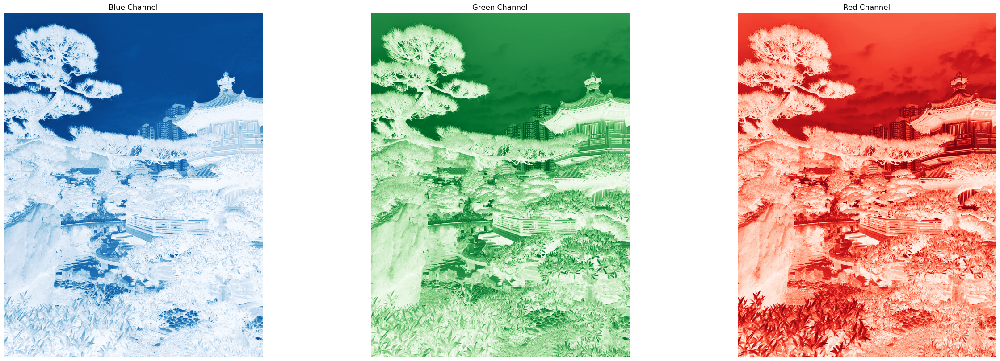

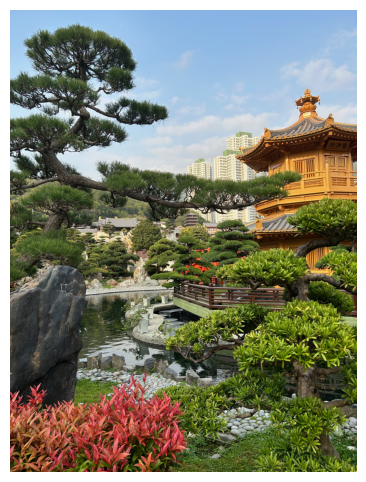

In [3]:
preview_image(img)

## Markov Chain (noice)

In [4]:
normal_image = normalize_image(img)
print(f"Min: {normal_image.min()} Max: {normal_image.max()}")

Min: -1.0 Max: 0.968627450980392


In [5]:
reverse_normal_image = denormalize_image(normal_image)
print(f"Min: {reverse_normal_image.min()} Max: {reverse_normal_image.max()}")

Min: 0 Max: 251


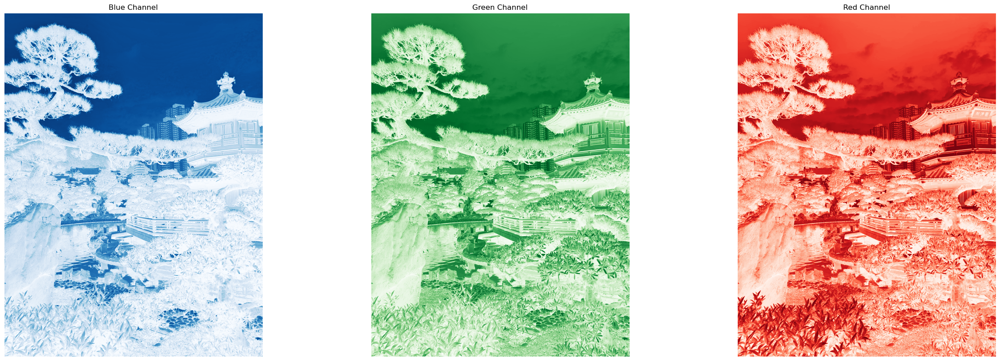

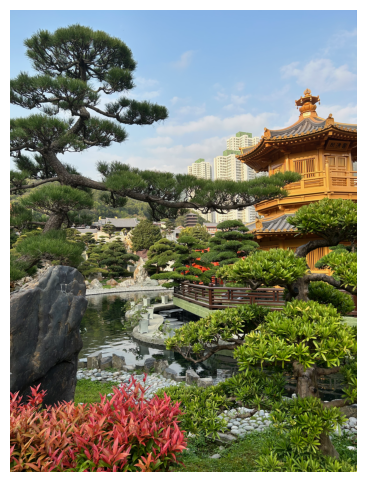

In [6]:
preview_image(reverse_normal_image)

Noice: Min: -0.05435830886806902 Max: 0.05834627192896203
Img Noice: Min: 120 Max: 134


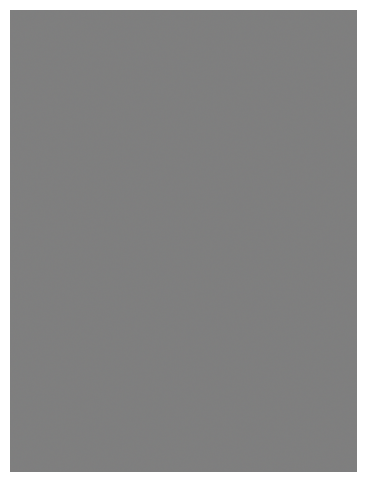

In [7]:
_, noice = noice_image(normal_image, 0.0, 0.01, noice_type="mult")
img_noice = denormalize_image(noice)

print(f"Noice: Min: {noice.min()} Max: {noice.max()}")
print(f"Img Noice: Min: {img_noice.min()} Max: {img_noice.max()}")

preview_image(denormalize_image(noice), show_channels=False)

In [8]:
beta0 = 0.01
mu = (1-beta0)**0.5
std = beta0

_, noice_beta = noice_image(normal_image, mu, std, noice_type="mult")

print(f"Noice: Min: {noice_beta.min()} Max: {noice_beta.max()}")

Noice: Min: 0.9380855274434938 Max: 1.0535267500533825


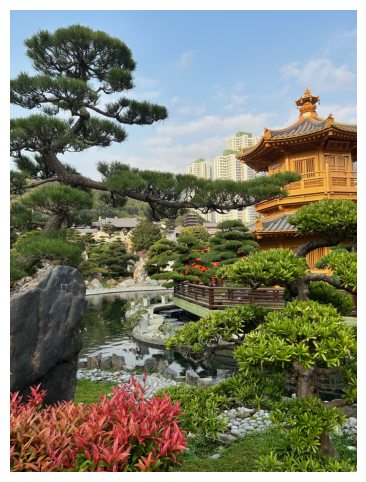

In [9]:
beta0 = 0.01
mu = (1-beta0)**0.5
std = beta0

noiced_img, noice_beta = noice_image(normal_image, mu, std, noice_type="mult")

preview_image(denormalize_image(noiced_img), vmin=0, vmax=255, show_channels=False)

In [10]:
from utils.transformations import markov_chain_noice
from utils.transformations import image_preprocessing

In [11]:
img0 = image_preprocessing(img)
print(img0.shape)
print(img0.min(), img0.max())

(256, 256, 3)
-1.0 0.968627450980392


In [12]:
images = markov_chain_noice(img0, starting_beta=1e-4, final_beta=0.02, T=2000)

Noicing data 10.0% with mean=0.999 and var=0.002...
Noicing data 20.0% with mean=0.998 and var=0.004...
Noicing data 30.0% with mean=0.997 and var=0.006...
Noicing data 40.0% with mean=0.996 and var=0.008...
Noicing data 50.0% with mean=0.995 and var=0.01...
Noicing data 60.0% with mean=0.994 and var=0.012...
Noicing data 70.0% with mean=0.993 and var=0.014...
Noicing data 80.0% with mean=0.992 and var=0.016...
Noicing data 90.0% with mean=0.991 and var=0.018...
Noicing data 100.0% with mean=0.99 and var=0.02...


In [13]:
from src.utils.viz_tools import preview_noiced_images

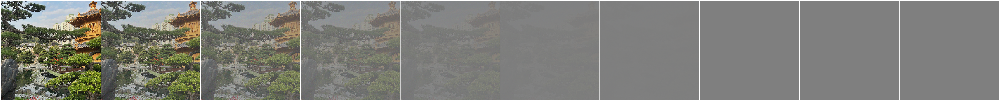

In [14]:
preview_noiced_images(images)

In [15]:
def load_and_noice_img(file_name):
    x = cv2.imread(file_name)
    img0 = image_preprocessing(x)
    print(img0.shape)
    print(img0.min(), img0.max())
    images = markov_chain_noice(img0, starting_beta=1e-4, final_beta=0.02, T=2000)
    preview_noiced_images(images)

(256, 256, 3)
-1.0 1.0
Noicing data 10.0% with mean=0.999 and var=0.002...
Noicing data 20.0% with mean=0.998 and var=0.004...
Noicing data 30.0% with mean=0.997 and var=0.006...
Noicing data 40.0% with mean=0.996 and var=0.008...
Noicing data 50.0% with mean=0.995 and var=0.01...
Noicing data 60.0% with mean=0.994 and var=0.012...
Noicing data 70.0% with mean=0.993 and var=0.014...
Noicing data 80.0% with mean=0.992 and var=0.016...
Noicing data 90.0% with mean=0.991 and var=0.018...
Noicing data 100.0% with mean=0.99 and var=0.02...


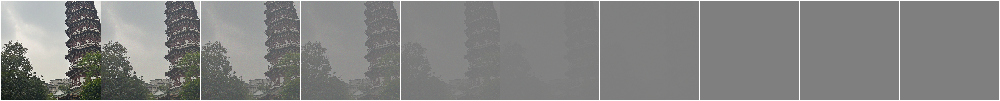

In [16]:
load_and_noice_img("images/my_photos/IMG_7043.png")